In [ ]:
# Install rasterio package for reading and viewing GeoTIFs, if not installed
!pip install rasterio

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 22.2/22.2 MB 82.5 MB/s eta 0:00:00


In [ ]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import rasterio
from matplotlib import pyplot as plt # Plotting tools
from rasterio.plot import show

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
%ls

drive/  sample_data/


In [ ]:
# Load the gravity database
df_gravity = pd.read_csv("drive/MyDrive/GPX/data/Block 1 Gravity.csv", index_col="Line")
# Load the magnetic database
df_magnetic = pd.read_csv("drive/MyDrive/GPX/data/Block 1 Magnetics.csv", index_col="Line")
# Load the radiometric database
df_radiometric = pd.read_csv("drive/MyDrive/GPX/data/Block 1 Radiometrics.csv", index_col="Line")

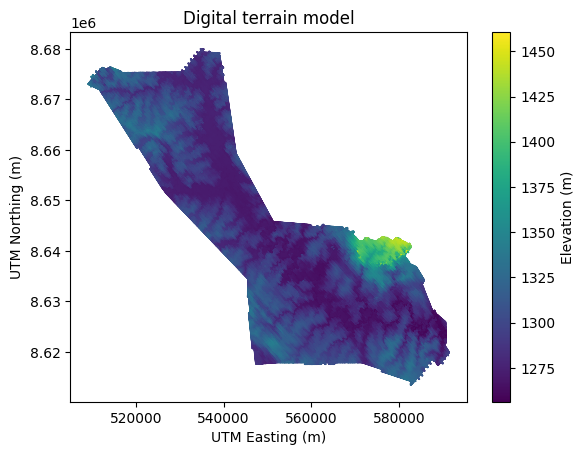

In [ ]:
# Plot the topography heights from the digital terrain model
fig, ax = plt.subplots()
h = ax.scatter(df_gravity["X"], df_gravity["Y"], s=0.1, c=df_gravity["Digital_terrain"])
ax.set_xlabel("UTM Easting (m)")
ax.set_ylabel("UTM Northing (m)")
ax.set_title("Digital terrain model")
plt.colorbar(h, label="Elevation (m)");

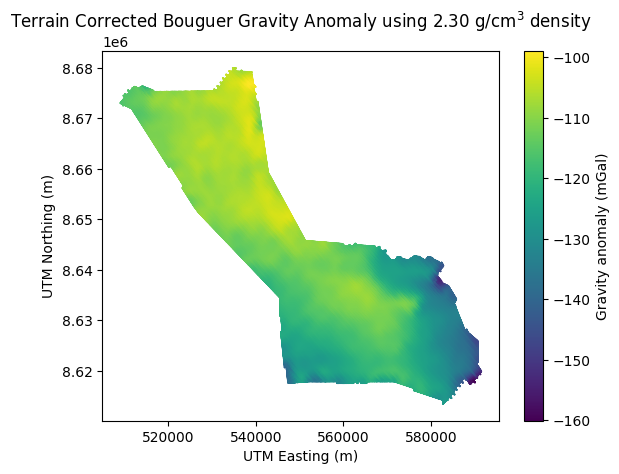

In [ ]:
# Plot the processed gravity data
fig, ax = plt.subplots()
h = ax.scatter(df_gravity["X"], df_gravity["Y"], s=0.1, c=df_gravity["Bouguer230_Processed"])
ax.set_xlabel("UTM Easting (m)")
ax.set_ylabel("UTM Northing (m)")
ax.set_title("Terrain Corrected Bouguer Gravity Anomaly using 2.30 g/cm$^3$ density")
plt.colorbar(h, label = "Gravity anomaly (mGal)");

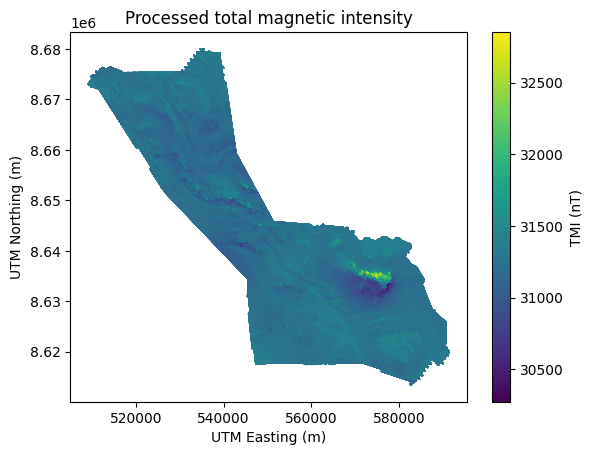

In [ ]:
# Plot the processed total magnetic intensity data
fig, ax = plt.subplots()
h = ax.scatter(df_magnetic["X"], df_magnetic["Y"], s=0.1, c=df_magnetic["Processed_magnetics"])
ax.set_xlabel("UTM Easting (m)")
ax.set_ylabel("UTM Northing (m)")
ax.set_title("Processed total magnetic intensity")
plt.colorbar(h, label = "TMI (nT)");

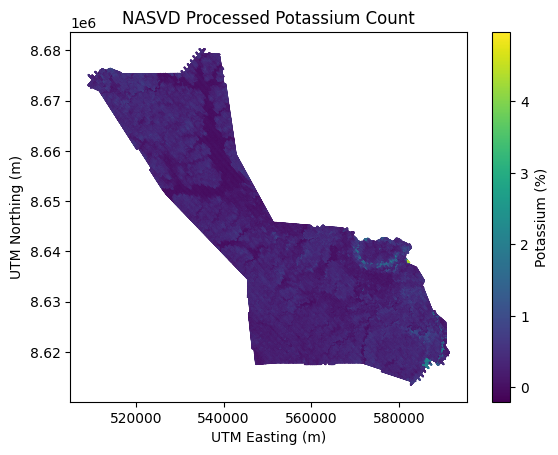

In [ ]:
# Plot the processed radiometric potassium estimates
fig, ax = plt.subplots()
h = ax.scatter(df_radiometric["X"], df_radiometric["Y"], s=0.1, c=df_radiometric["Potassium_NASVD_processed"])
ax.set_xlabel("UTM Easting (m)")
ax.set_ylabel("UTM Northing (m)")
ax.set_title("NASVD Processed Potassium Count")
plt.colorbar(h, label = "Potassium (%)");

### What is the data?

In [ ]:
print("===== GRAVITY DATASET COLUMNS =====")
print(df_gravity.columns.tolist())
print(f"Total features: {len(df_gravity.columns)}")
print("\n")

print("===== MAGNETIC DATASET COLUMNS =====")
print(df_magnetic.columns.tolist())
print(f"Total features: {len(df_magnetic.columns)}")
print("\n")

print("===== RADIOMETRIC DATASET COLUMNS =====")
print(df_radiometric.columns.tolist())
print(f"Total features: {len(df_radiometric.columns)}")

===== GRAVITY DATASET COLUMNS =====
['FID', 'Temperature', 'Lat', 'Long', 'Gps_Seconds', 'X', 'Y', 'SRTM', 'Baro_alt', 'Radar_alt', 'Bouguer230_Processed', 'Bouguer267_Processed', 'Digital_terrain', 'Gravity_disturbance_Raw', 'Gravity_Disturbance_Levelled', 'Gravity_disturbance_Processed', 'Processed_magnetics', 'GPS_Height', 'Gravity_Model', 'Grav_model_Processed']
Total features: 20


===== MAGNETIC DATASET COLUMNS =====
['X', 'Y', 'Flux_X', 'Flux_Y', 'Flux_Z', 'Flux_TF', 'Diurnal', 'Lat', 'Long', 'FID', 'Baro_alt', 'Radar_alt', 'Digital_terrain', 'Mag1_uncomp', 'Mag2_uncomp', 'Mag1_compensated', 'Mag2_compensated', 'GPS_Height', 'Gradient_levelled', 'UTC_time', 'Processed_magnetics']
Total features: 21


===== RADIOMETRIC DATASET COLUMNS =====
['X', 'Y', 'FID', 'Lat', 'Long', 'COSMIC', 'Humidity', 'Baro_alt', 'Radar_alt', 'Digital_terrain', 'GPS_Height', 'Potassium_Raw', 'Uranium_Raw', 'Thorium_Raw', 'Total_Count_Raw', 'Potassium_NASVD_processed', 'Uranium_NASVD_processed', 'Thorium

# Kobold Metals Sitatunga Airborne Geophysics Survey Channels

## 1. Gravity Dataset
The gravity dataset contains 20 features:

### Location Data
- FID
- Lat
- Long
- X
- Y

### Altitude Measurements
- SRTM
- Baro_alt
- Radar_alt
- GPS_Height
- Digital_terrain

### Gravity Measurements
- Bouguer230_Processed
- Bouguer267_Processed
- Gravity_disturbance_Raw
- Gravity_Disturbance_Levelled
- Gravity_disturbance_Processed
- Gravity_Model
- Grav_model_Processed

### Auxiliary Data
- Temperature
- Gps_Seconds
- Processed_magnetics

---

## 2. Magnetic Dataset
The magnetic dataset contains 21 features:

### Location Data
- X
- Y
- Lat
- Long
- FID

### Altitude Measurements
- Baro_alt
- Radar_alt
- GPS_Height
- Digital_terrain

### Magnetic Measurements
- Flux_X
- Flux_Y
- Flux_Z
- Flux_TF
- Mag1_uncomp
- Mag2_uncomp
- Mag1_compensated
- Mag2_compensated
- Gradient_levelled
- Processed_magnetics

### Corrections
- Diurnal

### Auxiliary Data
- UTC_time



---


## 3. Radiometric Dataset
The radiometric dataset contains 22 features:

### Location Data
- X
- Y
- Lat
- Long
- FID

### Altitude Measurements
- Baro_alt
- Radar_alt
- GPS_Height
- Digital_terrain

### Radiometric Measurements
- Potassium_Raw
- Uranium_Raw
- Thorium_Raw
- Total_Count_Raw
- Potassium_NASVD_processed
- Uranium_NASVD_processed
- Thorium_NASVD_processed
- Total_count_NASVD_processed

### Auxiliary Data
- COSMIC
- Humidity
- Temperature
- UTC_Time
- Live_time

# Channels Used for Geophysical Data Visualization

## Channels Used for Visualization

### Spatial Coordinates (All Datasets)
- **X, Y** (UTM coordinates in meters)

### Gravity Dataset
- **Digital_terrain** (for topography visualization)
- **Bouguer230_Processed** (terrain-corrected Bouguer gravity anomaly)

### Magnetic Dataset
- **Processed_magnetics** (final processed total magnetic intensity)

### Radiometric Dataset
- **Potassium_NASVD_processed** (processed potassium concentration)
- **Uranium_NASVD_processed** (typically used, though not shown in example code)
- **Thorium_NASVD_processed** (typically used, though not shown in example code)
- **Total_count_NASVD_processed** (typically used, though not shown in example code)

## Unused Channels

### Raw Measurements
- Gravity_disturbance_Raw
- Mag1_uncomp, Mag2_uncomp
- Potassium_Raw, Uranium_Raw, Thorium_Raw, Total_Count_Raw

### Flight Parameters
- Baro_alt, Radar_alt, GPS_Height
- Humidity, Temperature
- UTC_time, Gps_Seconds, Live_time

### Intermediate Processing Values
- Flux_X, Flux_Y, Flux_Z
- Diurnal corrections
- Multiple gravity models
- Gravity_disturbance_Levelled

### Location Data (Redundant)
- Lat, Long (when using X, Y UTM coordinates)
- FID (fiducial numbers)

## Notes on Visualization Approach
- Standard visualization uses spatial coordinates (X, Y) and final processed values
- Pre-interpolated GeoTIFF files are often preferred over plotting raw point data
- For specialized analysis, some of the unused channels may become relevant
- RGB composite visualizations often combine three radiometric channels (K-Th-U)

In [ ]:
%cd drive/MyDrive/GPX/data

/content/drive/MyDrive/GPX/data


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
import matplotlib.cm as cm
from scipy.interpolate import griddata
import os
from tqdm import tqdm
from PIL import Image

# Define the features to visualize
gravity_feature = 'Bouguer230_Processed'  # Adjust as needed
magnetic_feature = 'Processed_magnetics'  # Adjust as needed
radiometric_feature = 'Total_count_NASVD_processed'  # Adjust as needed

# Define output directory
output_dir = 'geophysics_crops'
os.makedirs(output_dir, exist_ok=True)

# Define crop parameters
crop_size_pixels = 256  # Size of each crop image in pixels
crop_size_meters = 1000  # Size of each crop in meters
crop_overlap = 0.25  # 25% overlap between adjacent crops

# Define custom colormaps for each channel
# You can adjust these as desired
gravity_cmap = plt.cm.viridis
magnetic_cmap = plt.cm.plasma
radiometric_cmap = plt.cm.inferno

# Step 1: Harmonize spatial coordinates
# Assuming X and Y are in the same coordinate system across all datasets
# Get the full extent of the survey area
min_x = min(df_gravity['X'].min(), df_magnetic['X'].min(), df_radiometric['X'].min())
max_x = max(df_gravity['X'].max(), df_magnetic['X'].max(), df_radiometric['X'].max())
min_y = min(df_gravity['Y'].min(), df_magnetic['Y'].min(), df_radiometric['Y'].min())
max_y = max(df_gravity['Y'].max(), df_magnetic['Y'].max(), df_radiometric['Y'].max())

# Step 2: Create a grid of crop centers
step_size = crop_size_meters * (1 - crop_overlap)
x_centers = np.arange(min_x + crop_size_meters/2, max_x - crop_size_meters/2, step_size)
y_centers = np.arange(min_y + crop_size_meters/2, max_y - crop_size_meters/2, step_size)

# Create empty list to store metadata
metadata = []

print(f"Processing {len(x_centers)} x {len(y_centers)} = {len(x_centers) * len(y_centers)} potential crops")

# Step 3 & 4: For each grid cell, extract data and create images
for i, x_center in enumerate(tqdm(x_centers, desc="Processing X")):
    for j, y_center in enumerate(tqdm(y_centers, desc="Processing Y", leave=False)):
        # Define crop boundaries
        left = x_center - crop_size_meters/2
        right = x_center + crop_size_meters/2
        bottom = y_center - crop_size_meters/2
        top = y_center + crop_size_meters/2

        # Create a relative position index for this crop
        rel_x = i
        rel_y = j

        # Extract data points within this crop
        gravity_crop = df_gravity[(df_gravity['X'] >= left) & (df_gravity['X'] <= right) &
                                 (df_gravity['Y'] >= bottom) & (df_gravity['Y'] <= top)]

        magnetic_crop = df_magnetic[(df_magnetic['X'] >= left) & (df_magnetic['X'] <= right) &
                                   (df_magnetic['Y'] >= bottom) & (df_magnetic['Y'] <= top)]

        radiometric_crop = df_radiometric[(df_radiometric['X'] >= left) & (df_radiometric['X'] <= right) &
                                        (df_radiometric['Y'] >= bottom) & (df_radiometric['Y'] <= top)]

        # If any crop has too few points, skip it
        min_points = 10  # Adjust as needed
        if (len(gravity_crop) < min_points or
            len(magnetic_crop) < min_points or
            len(radiometric_crop) < min_points):
            continue

        # Create a regular grid for interpolation
        grid_x, grid_y = np.mgrid[left:right:crop_size_pixels*1j, bottom:top:crop_size_pixels*1j]

        # Interpolate gravity data
        points_gravity = np.column_stack((gravity_crop['X'], gravity_crop['Y']))
        values_gravity = gravity_crop[gravity_feature].values
        grid_gravity = griddata(points_gravity, values_gravity, (grid_x, grid_y), method='linear')

        # Interpolate magnetic data
        points_magnetic = np.column_stack((magnetic_crop['X'], magnetic_crop['Y']))
        values_magnetic = magnetic_crop[magnetic_feature].values
        grid_magnetic = griddata(points_magnetic, values_magnetic, (grid_x, grid_y), method='linear')

        # Interpolate radiometric data
        points_radiometric = np.column_stack((radiometric_crop['X'], radiometric_crop['Y']))
        values_radiometric = radiometric_crop[radiometric_feature].values
        grid_radiometric = griddata(points_radiometric, values_radiometric, (grid_x, grid_y), method='linear')

        # Step 5: Generate individual channel images
        # Normalize each grid to [0,1] for visualization
        def normalize(grid):
            grid_min = np.nanmin(grid)
            grid_max = np.nanmax(grid)
            if grid_max > grid_min:
                return (grid - grid_min) / (grid_max - grid_min)
            else:
                return np.zeros_like(grid)

        norm_gravity = normalize(grid_gravity)
        norm_magnetic = normalize(grid_magnetic)
        norm_radiometric = normalize(grid_radiometric)

        # Create position ID for this crop
        position_id = f'position_{rel_x:03d}_{rel_y:03d}'

        # Apply colormaps to get RGB arrays (but without plotting)
        gravity_rgb = (gravity_cmap(norm_gravity)[:,:,:3] * 255).astype(np.uint8)
        magnetic_rgb = (magnetic_cmap(norm_magnetic)[:,:,:3] * 255).astype(np.uint8)
        radiometric_rgb = (radiometric_cmap(norm_radiometric)[:,:,:3] * 255).astype(np.uint8)

        # Save individual channel images directly using PIL
        Image.fromarray(gravity_rgb).save(os.path.join(output_dir, f'{position_id}_gravity.png'))
        Image.fromarray(magnetic_rgb).save(os.path.join(output_dir, f'{position_id}_magnetic.png'))
        Image.fromarray(radiometric_rgb).save(os.path.join(output_dir, f'{position_id}_radiometric.png'))

        # Create the combined RGB image
        combined_rgb = np.zeros((crop_size_pixels, crop_size_pixels, 3), dtype=np.uint8)
        combined_rgb[:,:,0] = (norm_gravity * 255).astype(np.uint8)  # Red channel = Gravity
        combined_rgb[:,:,1] = (norm_magnetic * 255).astype(np.uint8)  # Green channel = Magnetic
        combined_rgb[:,:,2] = (norm_radiometric * 255).astype(np.uint8)  # Blue channel = Radiometric

        # Save the combined RGB image
        Image.fromarray(combined_rgb).save(os.path.join(output_dir, f'{position_id}_rgb.png'))

        # Step 7: Save metadata
        metadata.append({
            'position_id': position_id,
            'rel_x': rel_x,
            'rel_y': rel_y,
            'x_center': x_center,
            'y_center': y_center,
            'left': left,
            'right': right,
            'bottom': bottom,
            'top': top,
            'gravity_points': len(gravity_crop),
            'magnetic_points': len(magnetic_crop),
            'radiometric_points': len(radiometric_crop)
        })

# Save metadata file
metadata_df = pd.DataFrame(metadata)
metadata_df.to_csv(os.path.join(output_dir, 'crop_metadata.csv'), index=False)

print(f"Generated {len(metadata)} crops in {output_dir}")

Processing 109 x 88 = 9592 potential crops


Streaming output truncated to the last 5000 lines.
Processing Y:   3%|▎         | 3/88 [00:00<00:03, 27.34it/s]<ipython-input-6-0da0dcbfee13>:100: RuntimeWarning: All-NaN slice encountered
  grid_min = np.nanmin(grid)
<ipython-input-6-0da0dcbfee13>:101: RuntimeWarning: All-NaN slice encountered
  grid_max = np.nanmax(grid)

Processing X: 100%|██████████| 109/109 [17:02<00:00,  9.38s/it]


Generated 3596 crops in geophysics_crops


Reconstructing grid of size 109 x 88


Processing channels:   0%|          | 0/4 [00:00<?, ?it/s]

Reconstructing gravity image...



Processing channels:  25%|██▌       | 1/4 [01:00<03:01, 60.64s/it]

Saved reconstructed gravity image to geophysics_crops/reconstructed_gravity.png
Reconstructing magnetic image...



Processing channels:  50%|█████     | 2/4 [02:10<02:12, 66.17s/it]

Saved reconstructed magnetic image to geophysics_crops/reconstructed_magnetic.png
Reconstructing radiometric image...



Processing channels:  75%|███████▌  | 3/4 [03:31<01:12, 72.78s/it]

Saved reconstructed radiometric image to geophysics_crops/reconstructed_radiometric.png
Reconstructing rgb image...



Processing channels: 100%|██████████| 4/4 [05:08<00:00, 77.17s/it]

Saved reconstructed rgb image to geophysics_crops/reconstructed_rgb.png


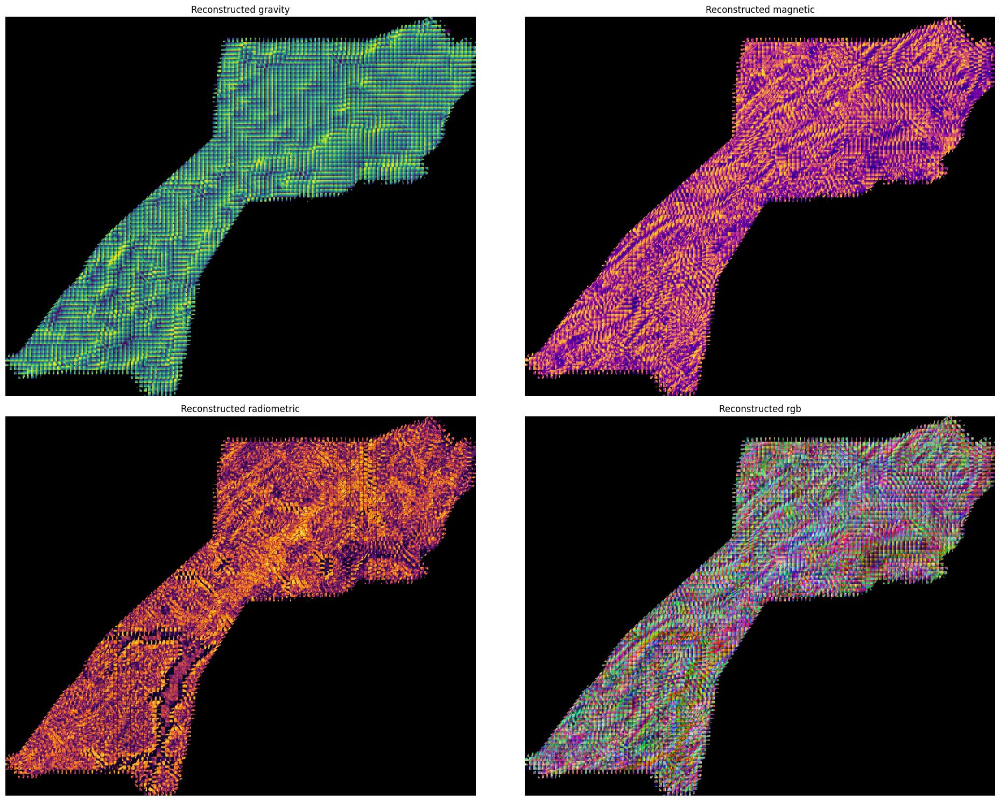

Reconstruction complete!


In [ ]:
import os
import numpy as np
import pandas as pd
from PIL import Image
import matplotlib.pyplot as plt
from tqdm import tqdm

# Define the directory containing crop images
crops_dir = 'geophysics_crops'

# Load the metadata file
metadata_file = os.path.join(crops_dir, 'crop_metadata.csv')
metadata = pd.read_csv(metadata_file)

# Determine the dimensions of the reconstructed grid
max_rel_x = metadata['rel_x'].max()
max_rel_y = metadata['rel_y'].max()
grid_width = max_rel_x + 1
grid_height = max_rel_y + 1

print(f"Reconstructing grid of size {grid_width} x {grid_height}")

# Load one image to get dimensions
sample_position = metadata['position_id'].iloc[0]
sample_path = os.path.join(crops_dir, f"{sample_position}_gravity.png")
sample_img = Image.open(sample_path)
crop_height, crop_width = np.array(sample_img).shape[:2]

# Create empty arrays for each channel's reconstructed image
channels = ['gravity', 'magnetic', 'radiometric', 'rgb']
reconstructed_images = {}

for channel in channels:
    if channel == 'rgb':
        # RGB image has 3 channels
        reconstructed_images[channel] = np.zeros((grid_height * crop_height,
                                                 grid_width * crop_width, 3),
                                                dtype=np.uint8)
    else:
        # Other images have 3 channels from the colormap
        reconstructed_images[channel] = np.zeros((grid_height * crop_height,
                                                 grid_width * crop_width, 3),
                                                dtype=np.uint8)

# Function to place a crop in the reconstructed image
def place_crop(reconstructed_image, crop_img, rel_x, rel_y, crop_height, crop_width):
    y_start = rel_y * crop_height
    y_end = y_start + crop_height
    x_start = rel_x * crop_width
    x_end = x_start + crop_width

    # Handle potential dimension mismatches
    img_array = np.array(crop_img)
    h, w = img_array.shape[:2]

    # Ensure we don't exceed bounds
    y_end = min(y_end, reconstructed_image.shape[0])
    x_end = min(x_end, reconstructed_image.shape[1])
    h = min(h, y_end - y_start)
    w = min(w, x_end - x_start)

    reconstructed_image[y_start:y_start+h, x_start:x_start+w] = img_array[:h, :w]

# Reconstruct each channel image
for channel in tqdm(channels, desc="Processing channels"):
    print(f"Reconstructing {channel} image...")

    # Process each crop
    for _, row in tqdm(metadata.iterrows(), total=len(metadata), desc=f"Placing {channel} crops"):
        position_id = row['position_id']
        rel_x = row['rel_x']
        rel_y = row['rel_y']

        # Load the crop image
        img_path = os.path.join(crops_dir, f"{position_id}_{channel}.png")
        if os.path.exists(img_path):
            crop_img = Image.open(img_path)
            place_crop(reconstructed_images[channel], crop_img, rel_x, rel_y, crop_height, crop_width)
        else:
            print(f"Warning: Missing image at {img_path}")

    # Save the reconstructed image
    output_path = os.path.join(crops_dir, f"reconstructed_{channel}.png")
    Image.fromarray(reconstructed_images[channel]).save(output_path)
    print(f"Saved reconstructed {channel} image to {output_path}")

# Create a figure to display the reconstructed images
plt.figure(figsize=(20, 15))

for i, channel in enumerate(channels):
    plt.subplot(2, 2, i+1)
    plt.imshow(reconstructed_images[channel])
    plt.title(f"Reconstructed {channel}")
    plt.axis('off')

plt.tight_layout()
plt.show()

print("Reconstruction complete!")



---



---



In [ ]:
import torch
from torch.utils.data import Dataset, DataLoader
import pandas as pd
import os
from PIL import Image
import numpy as np
import random
from torchvision import transforms

class GeophysicalDataset(Dataset):
    def __init__(self, metadata_path, img_dir, transform=None):
        self.metadata = pd.read_csv(metadata_path)
        self.img_dir = img_dir
        self.transform = transform
        self.channels = ['gravity', 'magnetic', 'radiometric', 'rgb']

        # Get grid dimensions for position normalization
        self.max_x = self.metadata['rel_x'].max()
        self.max_y = self.metadata['rel_y'].max()

    def __len__(self):
        return len(self.metadata)

    def __getitem__(self, idx):
        row = self.metadata.iloc[idx]
        position_id = row['position_id']

        # Load all channel images
        images = {}
        for channel in self.channels:
            img_path = os.path.join(self.img_dir, f"{position_id}_{channel}.png")
            images[channel] = Image.open(img_path).convert('RGB')

            if self.transform:
                images[channel] = self.transform(images[channel])

        # Create position encoding (normalized to [0,1])
        pos_x = row['rel_x'] / self.max_x
        pos_y = row['rel_y'] / self.max_y
        position = torch.tensor([pos_x, pos_y], dtype=torch.float)

        # Randomly select one channel to predict
        target_channel = random.choice(self.channels)

        # Create input tensor (concatenated remaining channels)
        input_channels = [ch for ch in self.channels if ch != target_channel]

        # Using the first 3 channels from the remaining list to keep input size consistent
        # This ensures our model input is always 9 channels (3 images × 3 RGB channels)
        input_channels = input_channels[:3]
        inputs = torch.cat([images[ch] for ch in input_channels], dim=0)

        return {
            'inputs': inputs,
            'target': images[target_channel],
            'position': position,
            'target_channel': target_channel,
            'position_id': position_id
        }

In [ ]:
import torch.nn as nn
import timm

class PositionalEncoding(nn.Module):
    def __init__(self, d_model, dropout=0.1):
        super().__init__()
        self.dropout = nn.Dropout(p=dropout)

        # Simple MLP to encode position
        self.pos_encoder = nn.Sequential(
            nn.Linear(2, 64),
            nn.ReLU(),
            nn.Linear(64, d_model)
        )

    def forward(self, x, pos):
        # x: [batch_size, channels, height, width]
        # pos: [batch_size, 2]

        # Encode position
        pos_encoding = self.pos_encoder(pos)  # [batch_size, d_model]

        # Reshape for broadcasting - match the channel dimension of x
        pos_encoding = pos_encoding.unsqueeze(-1).unsqueeze(-1)  # [batch_size, d_model, 1, 1]

        # Broadcast across spatial dimensions
        pos_encoding = pos_encoding.expand(-1, -1, x.shape[2], x.shape[3])

        # Add positional encoding to input
        return self.dropout(x + pos_encoding)


class GeophysicalSwinTransformer(nn.Module):
    def __init__(self, input_channels=6, output_channels=3):
        super().__init__()

        # Load pre-trained Swin Transformer
        self.backbone = timm.create_model(
            'swin_tiny_patch4_window7_224',
            pretrained=True,
            in_chans=input_channels
        )

        # Remove classification head
        self.backbone.head = nn.Identity()

        # Embedding dimension from Swin-T
        embed_dim = 768

        # Positional encoding
        self.pos_encoder = PositionalEncoding(d_model=embed_dim)

        # Decoder with proper upsampling to reach 224x224
        self.decoder = nn.Sequential(
            # Start with 7x7 feature map from SWIN
            nn.ConvTranspose2d(embed_dim, 256, kernel_size=4, stride=2, padding=1),  # 14x14
            nn.ReLU(),
            nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1),  # 28x28
            nn.ReLU(),
            nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1),  # 56x56
            nn.ReLU(),
            nn.ConvTranspose2d(64, 32, kernel_size=4, stride=2, padding=1),  # 112x112
            nn.ReLU(),
            nn.ConvTranspose2d(32, output_channels, kernel_size=4, stride=2, padding=1),  # 224x224
            nn.Sigmoid()
        )

    def forward(self, x, pos):
        # Extract features using backbone
        batch_size = x.shape[0]
        features = self.backbone.forward_features(x)  # [batch_size, 768]

        # Reshape features for decoder - SWIN outputs a 1D tensor per example
        # We need to reshape to a small spatial dimension
        features = features.reshape(batch_size, 768, 7, 7)  # Reshape to 7x7 spatial dimension

        # Add positional encoding
        features_with_pos = self.pos_encoder(features, pos)

        # Decode to full resolution image
        output = self.decoder(features_with_pos)  # Should now be 224x224

        return output

In [ ]:
import torch.optim as optim
from tqdm.notebook import tqdm

def train_model(model, dataloader, val_dataloader, num_epochs=10):
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    model = model.to(device)

    # Loss function and optimizer
    criterion = nn.MSELoss()
    optimizer = optim.AdamW(model.parameters(), lr=1e-4)

    # Learning rate scheduler
    scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, patience=2)

    for epoch in range(num_epochs):
        # Training phase
        model.train()
        running_loss = 0.0

        with tqdm(dataloader, desc=f"Epoch {epoch+1}/{num_epochs}") as pbar:
            for batch in pbar:
                inputs = batch['inputs'].to(device)
                targets = batch['target'].to(device)
                positions = batch['position'].to(device)

                # Zero the parameter gradients
                optimizer.zero_grad()

                # Forward pass
                outputs = model(inputs, positions)
                loss = criterion(outputs, targets)

                # Backward pass and optimize
                loss.backward()
                optimizer.step()

                running_loss += loss.item()
                pbar.set_postfix(loss=running_loss/len(pbar))

        # Validation phase
        model.eval()
        val_loss = 0.0

        with torch.no_grad():
            for batch in val_dataloader:
                inputs = batch['inputs'].to(device)
                targets = batch['target'].to(device)
                positions = batch['position'].to(device)

                outputs = model(inputs, positions)
                loss = criterion(outputs, targets)
                val_loss += loss.item()

        val_loss /= len(val_dataloader)
        print(f"Validation Loss: {val_loss:.4f}")

        # Update learning rate
        scheduler.step(val_loss)

        # Save checkpoint
        torch.save({
            'epoch': epoch,
            'model_state_dict': model.state_dict(),
            'optimizer_state_dict': optimizer.state_dict(),
            'loss': val_loss,
        }, f'geophysical_model_epoch_{epoch+1}.pth')

    return model

In [ ]:
# Set up transformations
transform = transforms.Compose([
    transforms.Resize((224, 224)),  # Resize to match SWIN input size
    transforms.ToTensor(),
])

# Create datasets
train_dataset = GeophysicalDataset(
    metadata_path='geophysics_crops/crop_metadata.csv',
    img_dir='geophysics_crops',
    transform=transform
)

# Split into train/val
train_size = int(0.8 * len(train_dataset))
val_size = len(train_dataset) - train_size
train_dataset, val_dataset = torch.utils.data.random_split(train_dataset, [train_size, val_size])

# Create dataloaders
train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True, num_workers=2)
val_loader = DataLoader(val_dataset, batch_size=16, shuffle=False, num_workers=2)

# Initialize model
model = GeophysicalSwinTransformer(input_channels=9, output_channels=3)
# Train the model
trained_model = train_model(model, train_loader, val_loader, num_epochs=20)

Epoch 1/20:   0%|          | 0/180 [00:00<?, ?it/s]

Validation Loss: 0.0611


Epoch 2/20:   0%|          | 0/180 [00:00<?, ?it/s]

Validation Loss: 0.0352


Epoch 3/20:   0%|          | 0/180 [00:00<?, ?it/s]

Validation Loss: 0.0164


Epoch 4/20:   0%|          | 0/180 [00:00<?, ?it/s]

Validation Loss: 0.0122


Epoch 5/20:   0%|          | 0/180 [00:00<?, ?it/s]

Validation Loss: 0.0100


Epoch 6/20:   0%|          | 0/180 [00:00<?, ?it/s]

Validation Loss: 0.0079


Epoch 7/20:   0%|          | 0/180 [00:00<?, ?it/s]

Validation Loss: 0.0071


Epoch 8/20:   0%|          | 0/180 [00:00<?, ?it/s]

Validation Loss: 0.0062


Epoch 9/20:   0%|          | 0/180 [00:00<?, ?it/s]

Validation Loss: 0.0058


Epoch 10/20:   0%|          | 0/180 [00:00<?, ?it/s]

Validation Loss: 0.0052


Epoch 11/20:   0%|          | 0/180 [00:00<?, ?it/s]

Validation Loss: 0.0048


Epoch 12/20:   0%|          | 0/180 [00:00<?, ?it/s]

Validation Loss: 0.0044


Epoch 13/20:   0%|          | 0/180 [00:00<?, ?it/s]

Validation Loss: 0.0047


Epoch 14/20:   0%|          | 0/180 [00:00<?, ?it/s]

Validation Loss: 0.0040


Epoch 15/20:   0%|          | 0/180 [00:00<?, ?it/s]

Validation Loss: 0.0048


Epoch 16/20:   0%|          | 0/180 [00:00<?, ?it/s]

Validation Loss: 0.0040


Epoch 17/20:   0%|          | 0/180 [00:00<?, ?it/s]

Validation Loss: 0.0035


Epoch 18/20:   0%|          | 0/180 [00:00<?, ?it/s]

Validation Loss: 0.0038


Epoch 19/20:   0%|          | 0/180 [00:00<?, ?it/s]

Validation Loss: 0.0041


Epoch 20/20:   0%|          | 0/180 [00:00<?, ?it/s]

Validation Loss: 0.0033


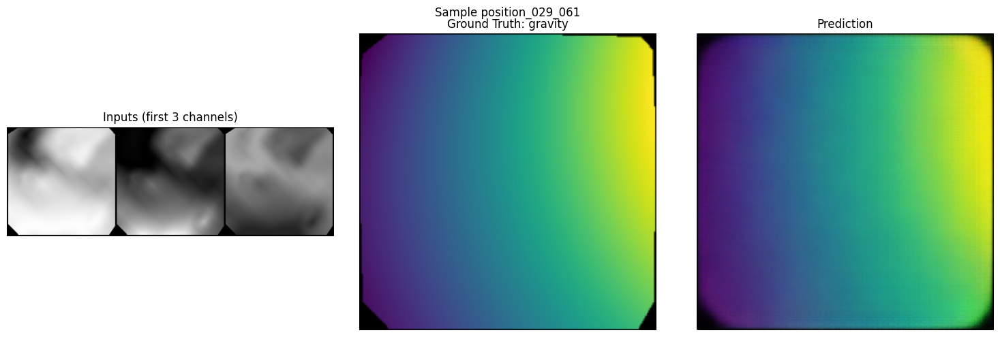

MSE for sample position_029_061 (predicting gravity): 0.001239


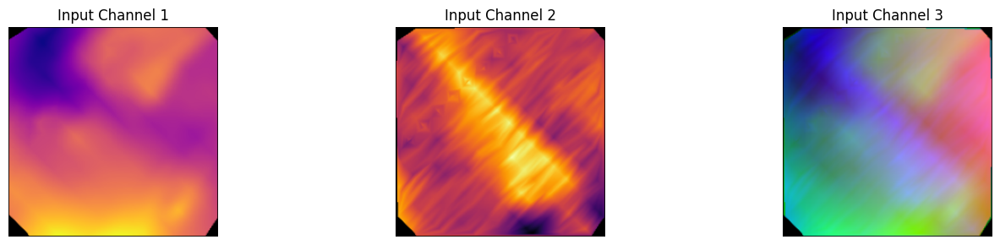

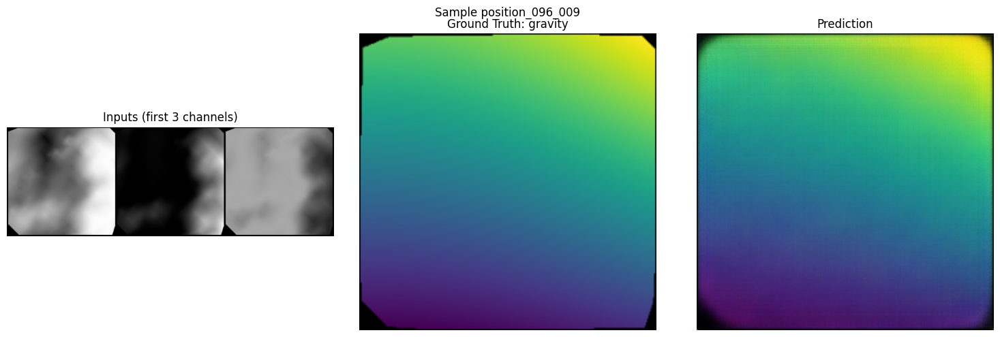

MSE for sample position_096_009 (predicting gravity): 0.001138


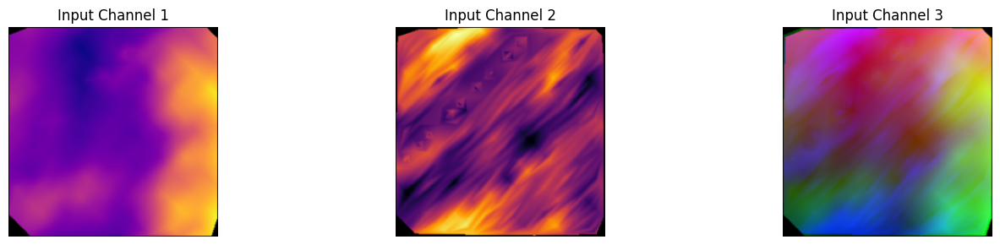

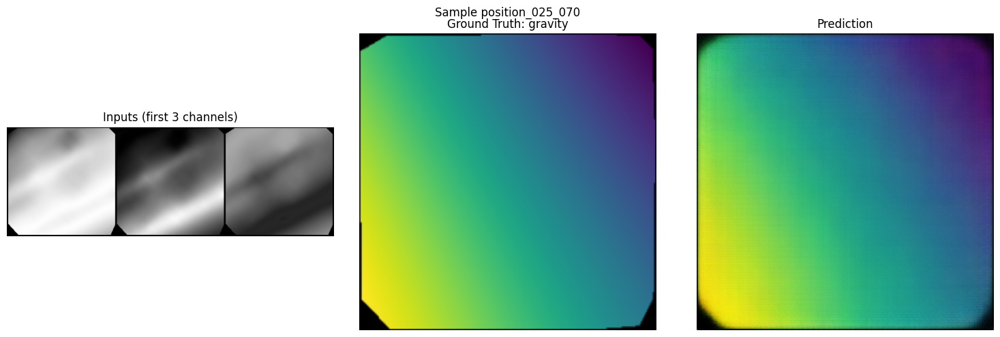

MSE for sample position_025_070 (predicting gravity): 0.001376


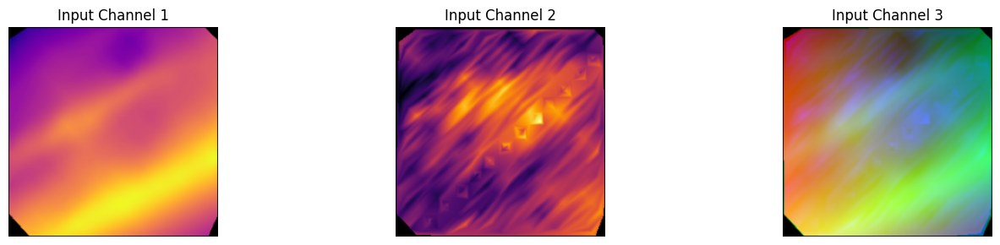

In [ ]:
import matplotlib.pyplot as plt
import torch
import random
from torchvision.utils import make_grid

def visualize_predictions(model, dataloader, num_samples=5):
    model.eval()

    # Detect device that the model is on
    device = next(model.parameters()).device

    # Get a batch from the dataloader
    batch = next(iter(dataloader))

    # Select random samples
    indices = random.sample(range(len(batch['inputs'])), min(num_samples, len(batch['inputs'])))

    with torch.no_grad():
        for idx in indices:
            # Move data to the same device as the model
            inputs = batch['inputs'][idx:idx+1].to(device)
            target = batch['target'][idx:idx+1].to(device)
            position = batch['position'][idx:idx+1].to(device)
            target_channel = batch['target_channel'][idx]
            position_id = batch['position_id'][idx]

            # Get model prediction
            prediction = model(inputs, position)

            # Move tensors back to CPU for visualization
            inputs_display = inputs[0].cpu()  # Shape: [9, H, W]
            target_display = target[0].cpu()  # Shape: [3, H, W]
            pred_display = prediction[0].cpu()  # Shape: [3, H, W]

            # Create a figure
            plt.figure(figsize=(15, 5))

            # Display inputs (showing first three channels only for clarity)
            plt.subplot(1, 3, 1)
            plt.imshow(make_grid(inputs_display[:3].unsqueeze(1), nrow=3).permute(1, 2, 0))
            plt.title(f"Inputs (first 3 channels)")
            plt.axis('off')

            # Display ground truth
            plt.subplot(1, 3, 2)
            plt.imshow(target_display.permute(1, 2, 0))
            plt.title(f"Ground Truth: {target_channel}")
            plt.axis('off')

            # Display prediction
            plt.subplot(1, 3, 3)
            plt.imshow(pred_display.permute(1, 2, 0))
            plt.title(f"Prediction")
            plt.axis('off')

            plt.suptitle(f"Sample {position_id}")
            plt.tight_layout()
            plt.show()

            # Calculate MSE for this sample
            mse = torch.nn.functional.mse_loss(prediction, target).item()
            print(f"MSE for sample {position_id} (predicting {target_channel}): {mse:.6f}")

            # Optional: show each input channel separately
            plt.figure(figsize=(15, 3))
            for i in range(3):  # Show first 3 input channels
                plt.subplot(1, 3, i+1)
                plt.imshow(inputs_display[i*3:i*3+3].permute(1, 2, 0))
                plt.title(f"Input Channel {i+1}")
                plt.axis('off')
            plt.tight_layout()
            plt.show()

# Run visualization on validation set
visualize_predictions(model, val_loader, num_samples=3)

In [ ]:
import torch
import torch.nn as nn
import numpy as np
import pandas as pd
from tqdm.notebook import tqdm

# Define a feature extraction model
class FeatureExtractor(nn.Module):
    def __init__(self, trained_model):
        super().__init__()
        self.backbone = trained_model.backbone

    def forward(self, x):
        # Use the forward_features method which returns features before classification
        return self.backbone.forward_features(x)

def extract_features_simple(model, dataloader, output_file='geophysics_features.npz'):
    # Create the feature extractor
    extractor = FeatureExtractor(model)

    # Get the device the model is on
    device = next(extractor.parameters()).device

    # Set to evaluation mode
    extractor.eval()

    # Prepare lists to store extracted data
    all_features = []
    all_positions = []
    all_ids = []

    print("Extracting features...")
    with torch.no_grad():
        for batch in tqdm(dataloader):
            # Move data to the same device as model
            inputs = batch['inputs'].to(device)
            positions = batch['position']

            # Extract features
            features_batch = extractor(inputs)

            # Move to CPU and convert to numpy
            features_batch = features_batch.cpu().numpy()

            # Store results
            all_features.append(features_batch)
            all_positions.append(positions.numpy())
            all_ids.extend(batch['position_id'])

    # Convert lists to arrays
    features_array = np.vstack(all_features)
    positions_array = np.vstack(all_positions)

    print(f"Extracted features shape: {features_array.shape}")

    # Save features to file
    np.savez(
        output_file,
        features=features_array,
        positions=positions_array,
        ids=np.array(all_ids)
    )

    print(f"Features saved to {output_file}")

    # Create a DataFrame with basic metadata
    feature_df = pd.DataFrame({
        'position_id': all_ids,
        'rel_x': positions_array[:, 0],
        'rel_y': positions_array[:, 1],
        'feature_idx': range(len(all_ids))
    })

    return features_array, positions_array, all_ids, feature_df

# Extract features from the full dataset
# Create a dataloader for the full dataset (not just validation)
full_dataset = GeophysicalDataset(
    metadata_path='geophysics_crops/crop_metadata.csv',
    img_dir='geophysics_crops',
    transform=transform
)

full_loader = DataLoader(full_dataset, batch_size=16, shuffle=False, num_workers=2)

# Extract features
features, positions, ids, feature_df = extract_features_simple(model, full_loader, 'geophysics_features.npz')

# Display feature information
print(f"Total features extracted: {len(ids)}")
print(f"Feature dimensionality: {features.shape[1]}")
print("\nSample of feature metadata:")
print(feature_df.head())

# Save metadata as CSV for easier access
feature_df.to_csv('geophysics_feature_metadata.csv', index=False)
print("Feature metadata saved to geophysics_feature_metadata.csv")

Extracting features...


  0%|          | 0/225 [00:00<?, ?it/s]

Extracted features shape: (3596, 7, 7, 768)
Features saved to geophysics_features.npz
Total features extracted: 3596
Feature dimensionality: 7

Sample of feature metadata:
        position_id     rel_x     rel_y  feature_idx
0  position_000_078  0.000000  0.896552            0
1  position_000_079  0.000000  0.908046            1
2  position_000_080  0.000000  0.919540            2
3  position_000_081  0.000000  0.931035            3
4  position_001_078  0.009259  0.896552            4
Feature metadata saved to geophysics_feature_metadata.csv


Original features shape: (3596, 7, 7, 768)
Reshaped features shape: (3596, 37632)
Running t-SNE on 3596 samples with 37632 dimensions...


/usr/local/lib/python3.11/dist-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


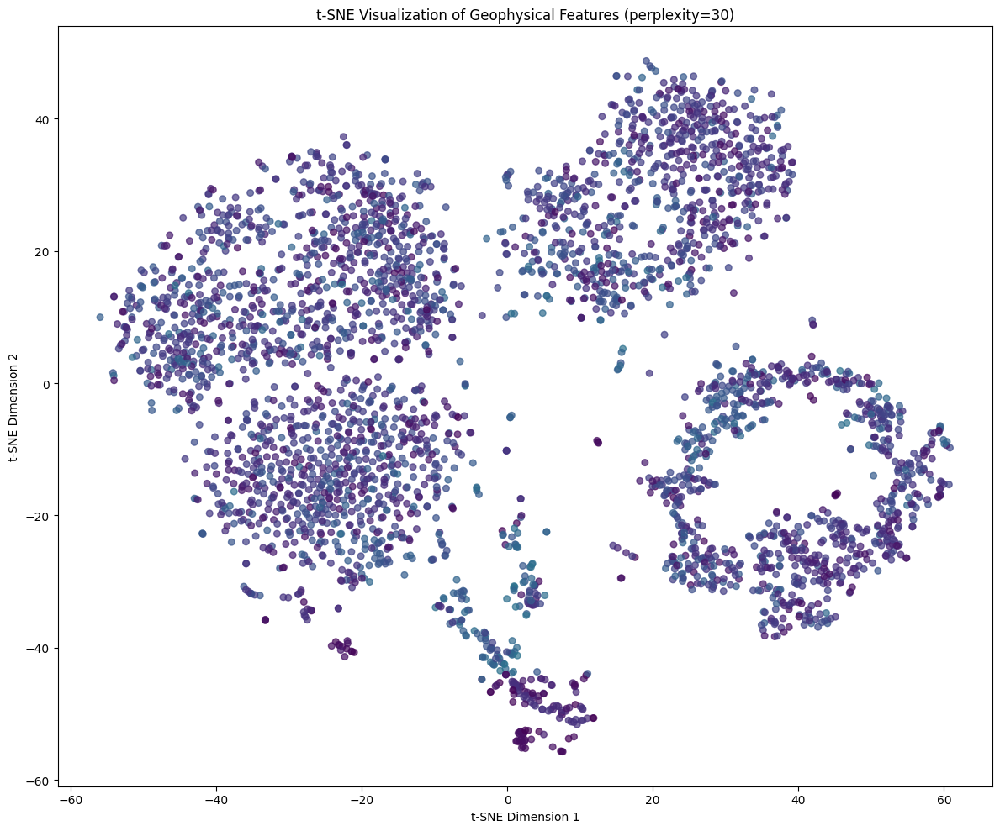

Running UMAP on 3596 samples with 37632 dimensions...


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


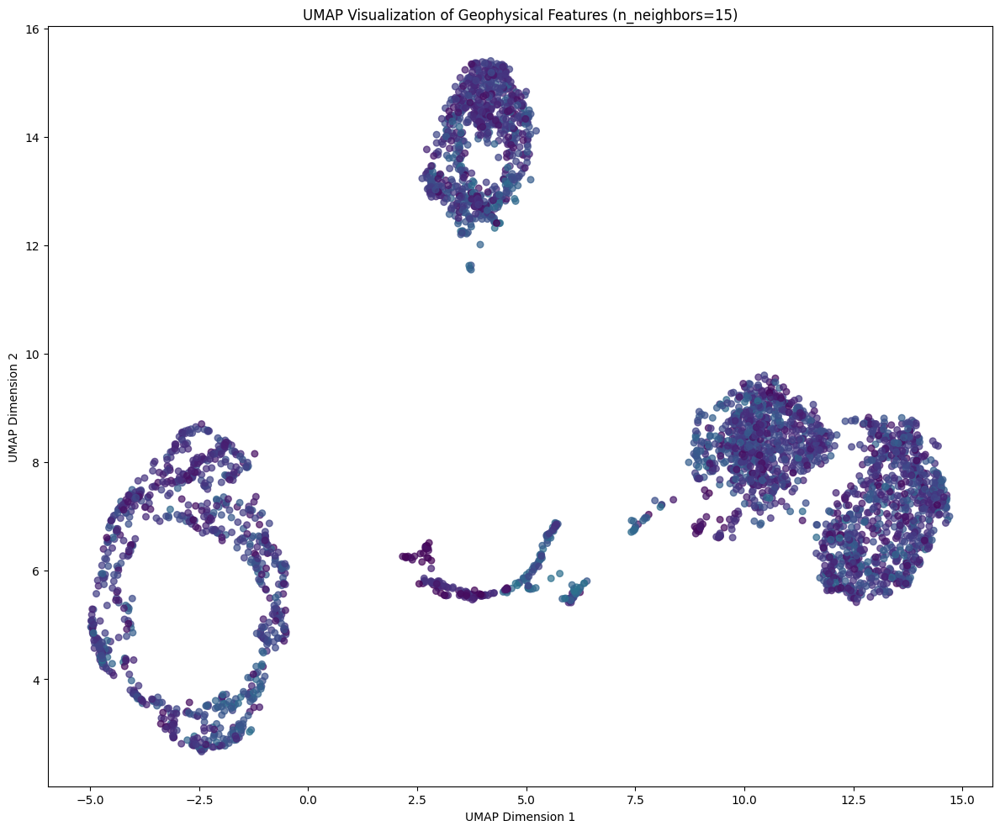

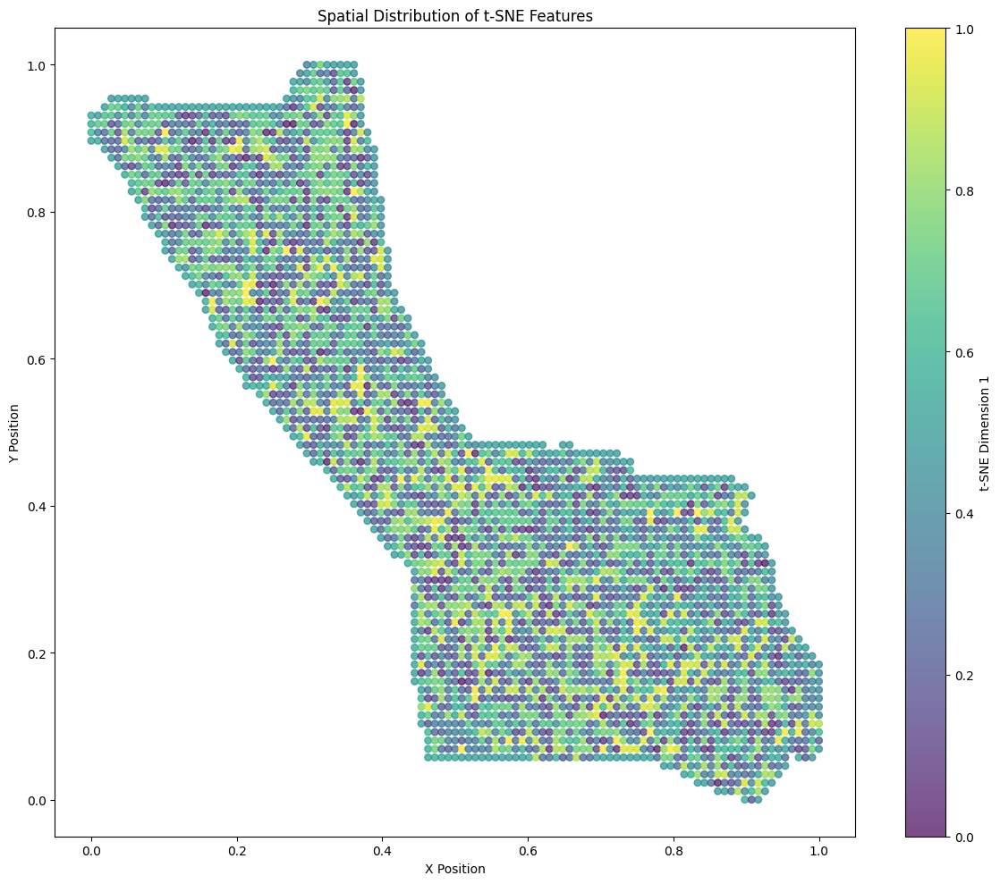

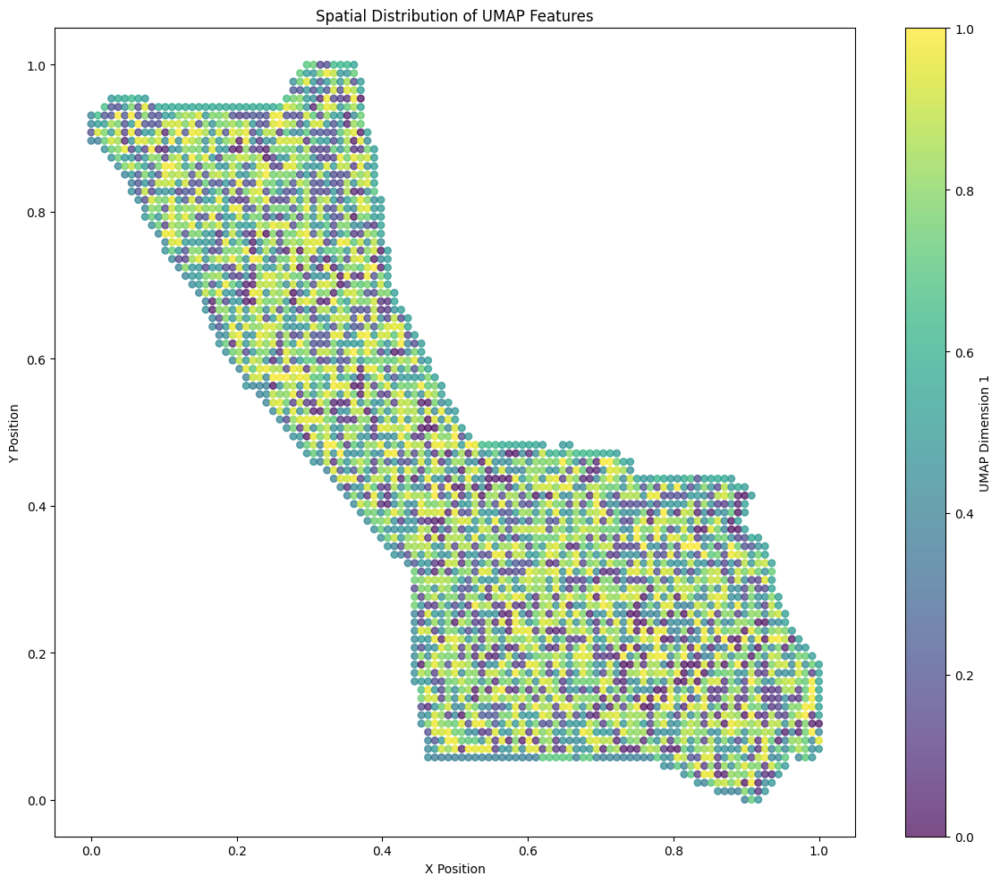

Running anomaly detection using isolation_forest...


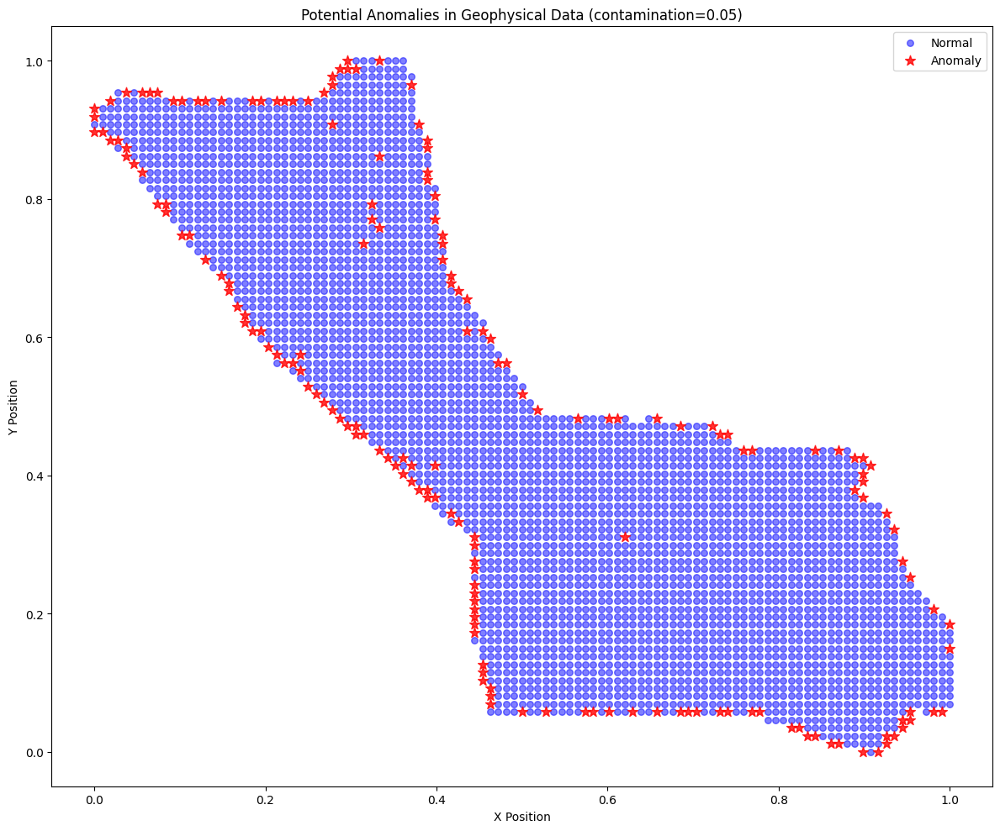

Detected 180 potential anomalies (5.0% of data)


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
import umap
from tqdm.notebook import tqdm

# Check the shape of the features array
print(f"Original features shape: {features.shape}")

# Reshape the features to 2D (samples x features)
reshaped_features = features.reshape(features.shape[0], -1)
print(f"Reshaped features shape: {reshaped_features.shape}")

# Function to create visualization using t-SNE
def visualize_tsne(features, positions, perplexity=30, n_iter=1000):
    print(f"Running t-SNE on {features.shape[0]} samples with {features.shape[1]} dimensions...")

    # Apply t-SNE dimensionality reduction
    tsne = TSNE(n_components=2, perplexity=perplexity, n_iter=n_iter, random_state=42)
    features_2d = tsne.fit_transform(features)

    # Create scatter plot
    plt.figure(figsize=(12, 10))

    # Normalize X and Y positions to [0, 1] for coloring
    x_norm = (positions[:, 0] - positions[:, 0].min()) / (positions[:, 0].max() - positions[:, 0].min())
    y_norm = (positions[:, 1] - positions[:, 1].min()) / (positions[:, 1].max() - positions[:, 1].min())

    # Create a color map based on position
    # Use x_norm for red channel and y_norm for green channel
    colors = plt.cm.viridis(x_norm * y_norm)

    # Plot the points
    plt.scatter(features_2d[:, 0], features_2d[:, 1], c=colors, alpha=0.7, s=30)

    plt.title(f't-SNE Visualization of Geophysical Features (perplexity={perplexity})')
    plt.xlabel('t-SNE Dimension 1')
    plt.ylabel('t-SNE Dimension 2')
    plt.tight_layout()
    plt.savefig(f'tsne_visualization_p{perplexity}.png', dpi=300)
    plt.show()

    return features_2d

# Function to create visualization using UMAP
def visualize_umap(features, positions, n_neighbors=15, min_dist=0.1):
    print(f"Running UMAP on {features.shape[0]} samples with {features.shape[1]} dimensions...")

    # Apply UMAP dimensionality reduction
    reducer = umap.UMAP(n_neighbors=n_neighbors, min_dist=min_dist, random_state=42)
    features_2d = reducer.fit_transform(features)

    # Create scatter plot
    plt.figure(figsize=(12, 10))

    # Normalize X and Y positions to [0, 1] for coloring
    x_norm = (positions[:, 0] - positions[:, 0].min()) / (positions[:, 0].max() - positions[:, 0].min())
    y_norm = (positions[:, 1] - positions[:, 1].min()) / (positions[:, 1].max() - positions[:, 1].min())

    # Create a color map based on position
    colors = plt.cm.viridis(x_norm * y_norm)

    # Plot the points
    plt.scatter(features_2d[:, 0], features_2d[:, 1], c=colors, alpha=0.7, s=30)

    plt.title(f'UMAP Visualization of Geophysical Features (n_neighbors={n_neighbors})')
    plt.xlabel('UMAP Dimension 1')
    plt.ylabel('UMAP Dimension 2')
    plt.tight_layout()
    plt.savefig(f'umap_visualization_n{n_neighbors}.png', dpi=300)
    plt.show()

    return features_2d

# Additional visualization: spatial map of features
def visualize_spatial_map(features_2d, positions, method='t-SNE'):
    plt.figure(figsize=(12, 10))

    # Normalize feature dimensions for coloring
    dim1_norm = (features_2d[:, 0] - features_2d[:, 0].min()) / (features_2d[:, 0].max() - features_2d[:, 0].min())

    # Plot points at their spatial locations
    plt.scatter(
        positions[:, 0],
        positions[:, 1],
        c=dim1_norm,
        s=30,
        cmap='viridis',
        alpha=0.7
    )

    plt.colorbar(label=f'{method} Dimension 1')
    plt.title(f'Spatial Distribution of {method} Features')
    plt.xlabel('X Position')
    plt.ylabel('Y Position')
    plt.tight_layout()
    plt.savefig(f'spatial_map_{method.lower()}.png', dpi=300)
    plt.show()

# Function for anomaly detection
def visualize_anomalies(features, positions, ids, method='isolation_forest', contamination=0.05):
    from sklearn.ensemble import IsolationForest
    print(f"Running anomaly detection using {method}...")

    # Apply anomaly detection
    detector = IsolationForest(contamination=contamination, random_state=42)
    # -1 for anomalies, 1 for normal samples
    anomaly_scores = detector.fit_predict(features)
    # Convert to boolean (True for anomalies)
    is_anomaly = anomaly_scores == -1

    # Create a scatter plot of the spatial distribution with anomalies highlighted
    plt.figure(figsize=(12, 10))

    # Plot normal points
    plt.scatter(
        positions[~is_anomaly, 0],
        positions[~is_anomaly, 1],
        c='blue',
        s=30,
        alpha=0.5,
        label='Normal'
    )

    # Plot anomalies
    plt.scatter(
        positions[is_anomaly, 0],
        positions[is_anomaly, 1],
        c='red',
        s=80,
        alpha=0.8,
        marker='*',
        label='Anomaly'
    )

    plt.title(f'Potential Anomalies in Geophysical Data (contamination={contamination})')
    plt.xlabel('X Position')
    plt.ylabel('Y Position')
    plt.legend()
    plt.tight_layout()
    plt.savefig(f'anomaly_detection_{method}.png', dpi=300)
    plt.show()

    # Return anomaly information
    anomaly_indices = np.where(is_anomaly)[0]
    anomaly_positions = positions[is_anomaly]
    anomaly_ids = [ids[i] for i in anomaly_indices]

    print(f"Detected {len(anomaly_indices)} potential anomalies ({contamination*100:.1f}% of data)")

    return anomaly_indices, anomaly_positions, anomaly_ids

# Run visualizations
tsne_result = visualize_tsne(reshaped_features, positions, perplexity=30)
umap_result = visualize_umap(reshaped_features, positions, n_neighbors=15)

# Create spatial maps of the reduced features
visualize_spatial_map(tsne_result, positions, method='t-SNE')
visualize_spatial_map(umap_result, positions, method='UMAP')

# Run anomaly detection
anomaly_indices, anomaly_positions, anomaly_ids = visualize_anomalies(
    reshaped_features, positions, ids, contamination=0.05)



---



---



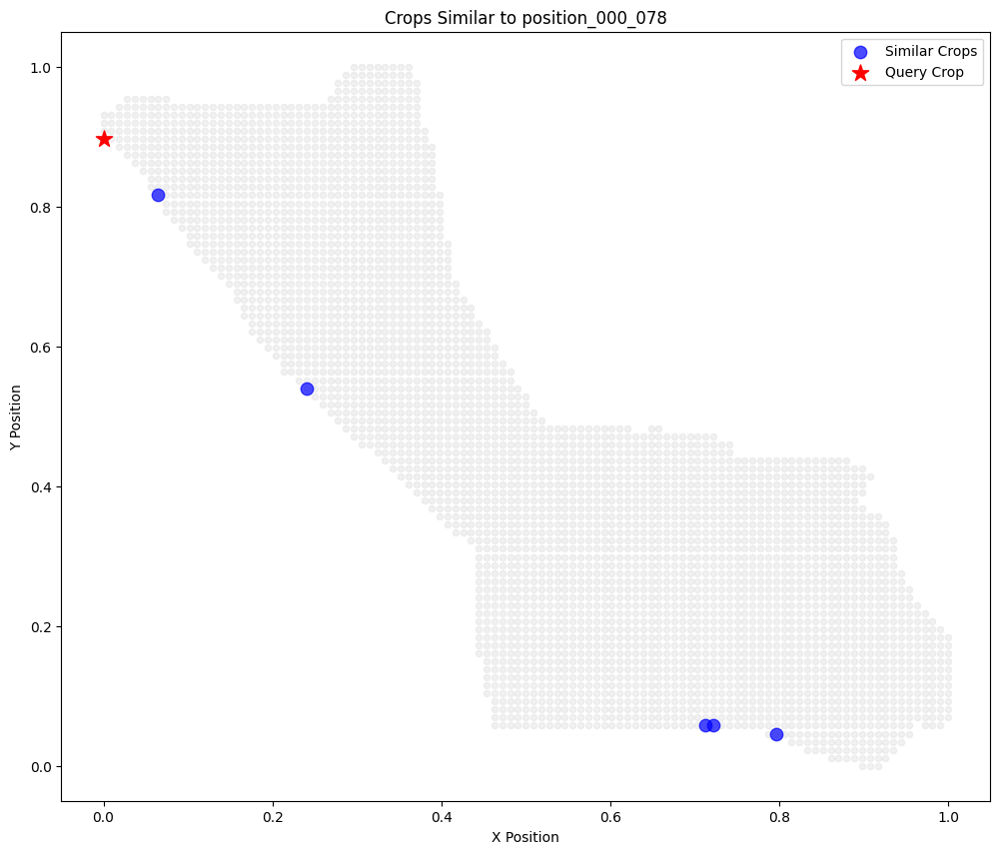

Query: position_000_078
Similar crops:
  1. position_026_047 (distance: 239.1085)
  2. position_077_005 (distance: 239.2294)
  3. position_078_005 (distance: 241.9919)
  4. position_086_004 (distance: 243.0570)
  5. position_007_071 (distance: 246.5756)


(['position_026_047',
  'position_077_005',
  'position_078_005',
  'position_086_004',
  'position_007_071'],
 array([239.10852051, 239.22944641, 241.99186707, 243.05699158,
        246.57559204]))

In [ ]:
from sklearn.neighbors import NearestNeighbors
import numpy as np
import matplotlib.pyplot as plt

# Create a similarity search model using SWIN-SatMAE embeddings
def create_similarity_search(features, positions, ids):
    # Create and fit the nearest neighbors model
    knn = NearestNeighbors(n_neighbors=10, algorithm='auto')
    knn.fit(features)

    def find_similar_crops(query_id, k=5, visualize=True):
        # Get the index for the query crop
        if isinstance(query_id, str):
            # If query is a crop ID
            idx = list(ids).index(query_id)
        else:
            # If query is already an index
            idx = query_id
            query_id = ids[idx]

        # Find k nearest neighbors
        distances, indices = knn.kneighbors(features[idx].reshape(1, -1), n_neighbors=k+1)

        # The first result is the query itself, so skip it
        similar_indices = indices[0][1:]
        similar_distances = distances[0][1:]
        similar_ids = [ids[i] for i in similar_indices]

        # If visualization is requested
        if visualize:
            plt.figure(figsize=(12, 10))

            # Plot all positions as background
            plt.scatter(positions[:, 0], positions[:, 1], c='lightgray', alpha=0.3, s=20)

            # Plot similar crops
            plt.scatter(
                positions[similar_indices, 0],
                positions[similar_indices, 1],
                c='blue',
                s=80,
                alpha=0.7,
                label='Similar Crops'
            )

            # Plot the query crop
            plt.scatter(
                positions[idx, 0],
                positions[idx, 1],
                c='red',
                s=150,
                marker='*',
                label='Query Crop'
            )

            plt.title(f'Crops Similar to {query_id}')
            plt.xlabel('X Position')
            plt.ylabel('Y Position')
            plt.legend()
            plt.show()

            # Print similarity information
            print(f"Query: {query_id}")
            print("Similar crops:")
            for i, (sim_id, dist) in enumerate(zip(similar_ids, similar_distances)):
                print(f"  {i+1}. {sim_id} (distance: {dist:.4f})")

        return similar_ids, similar_distances

    return find_similar_crops

# Create the similarity search function
similarity_search = create_similarity_search(reshaped_features, positions, ids)

# Example: Find crops similar to the first one
similarity_search(ids[0], k=5)

Running anomaly detection on 3292 interior points (excluding edge buffer)...


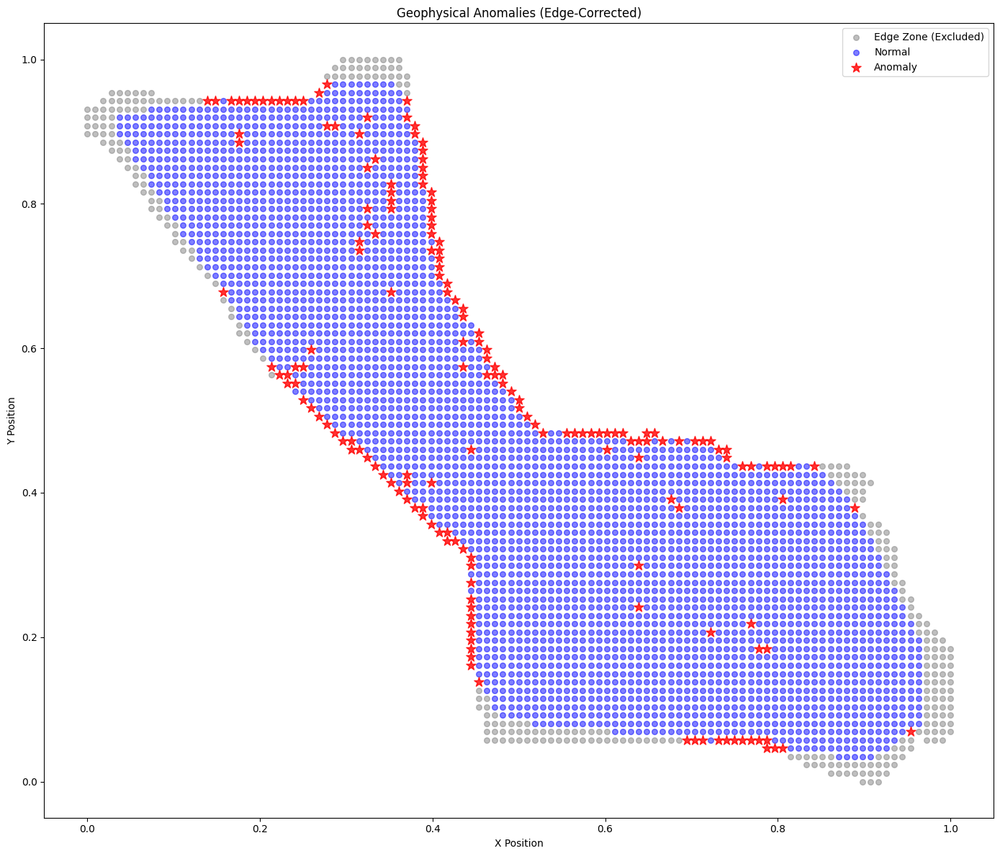

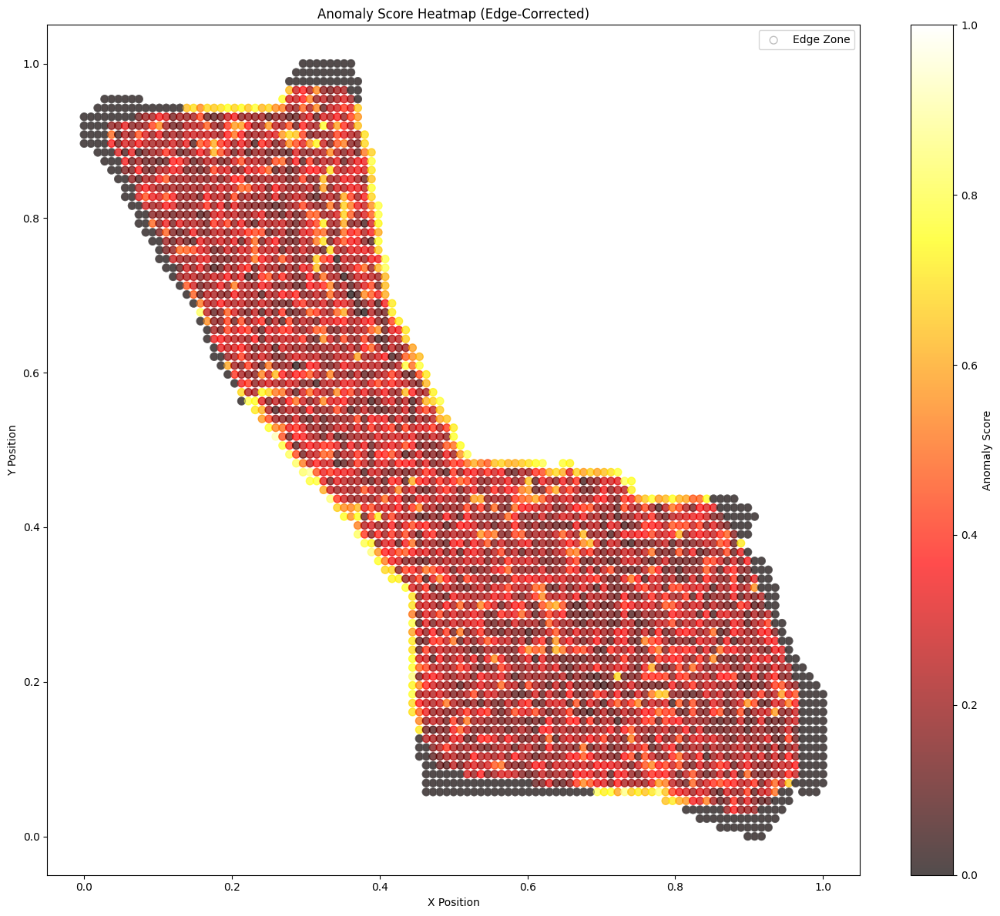

Detected 180 potential anomalies in interior region
Excluded 304 edge points from anomaly detection


In [ ]:
from sklearn.ensemble import IsolationForest
import numpy as np
import matplotlib.pyplot as plt
from scipy.spatial import ConvexHull

def detect_anomalies_with_edge_correction(features, positions, ids, contamination=0.05, edge_buffer=0.05):
    """
    Detect anomalies while accounting for edge effects

    Parameters:
    - features: Extracted features from SWIN-SatMAE model
    - positions: Array of spatial positions
    - ids: List of crop IDs
    - contamination: Proportion of samples to consider as anomalies
    - edge_buffer: Distance from boundary to consider as edge zone
    """
    # First, identify the boundary of the survey area
    # We'll use ConvexHull to get the outer boundary
    hull = ConvexHull(positions)
    boundary_indices = hull.vertices

    # Create a mask for interior points (non-edge)
    # We'll consider a point to be on the edge if it's within edge_buffer distance of the boundary
    is_interior = np.ones(len(positions), dtype=bool)

    # For each point, check if it's near the boundary
    for i in range(len(positions)):
        # Calculate minimum distance to the boundary
        min_dist = np.inf
        for j in range(len(boundary_indices)):
            idx1 = boundary_indices[j]
            idx2 = boundary_indices[(j + 1) % len(boundary_indices)]

            # Calculate distance to line segment
            p = positions[i]
            v = positions[idx2] - positions[idx1]
            w = p - positions[idx1]

            # Check if projection is on the line segment
            c1 = np.dot(w, v)
            if c1 <= 0:
                dist = np.linalg.norm(p - positions[idx1])
            else:
                c2 = np.dot(v, v)
                if c1 >= c2:
                    dist = np.linalg.norm(p - positions[idx2])
                else:
                    b = c1 / c2
                    pb = positions[idx1] + b * v
                    dist = np.linalg.norm(p - pb)

            min_dist = min(min_dist, dist)

        # Mark as edge point if within buffer distance
        if min_dist < edge_buffer:
            is_interior[i] = False

    # Apply Isolation Forest only to interior points
    print(f"Running anomaly detection on {sum(is_interior)} interior points (excluding edge buffer)...")

    # Adjust contamination for interior points
    interior_contamination = contamination * len(positions) / sum(is_interior)
    interior_contamination = min(interior_contamination, 0.3)  # Cap at 30% to avoid excessive anomalies

    detector = IsolationForest(contamination=interior_contamination, random_state=42)

    # Initialize anomaly scores
    anomaly_scores = np.zeros(len(positions))
    is_anomaly = np.zeros(len(positions), dtype=bool)

    # Apply anomaly detection only to interior points
    if sum(is_interior) > 10:  # Need enough points for meaningful detection
        interior_scores = detector.fit_predict(features[is_interior])
        decision_values = detector.decision_function(features[is_interior])

        # Transfer results back to full array
        anomaly_scores[is_interior] = -decision_values  # Convert to anomaly score (higher = more anomalous)
        is_anomaly[is_interior] = (interior_scores == -1)

    # Normalize scores to [0, 1]
    if np.max(anomaly_scores) > np.min(anomaly_scores):
        normalized_scores = (anomaly_scores - np.min(anomaly_scores)) / (np.max(anomaly_scores) - np.min(anomaly_scores))
    else:
        normalized_scores = np.zeros_like(anomaly_scores)

    # Plot the results
    plt.figure(figsize=(14, 12))

    # Plot interior vs edge points
    plt.scatter(
        positions[~is_interior, 0],
        positions[~is_interior, 1],
        c='gray',
        s=30,
        alpha=0.5,
        label='Edge Zone (Excluded)'
    )

    plt.scatter(
        positions[is_interior & ~is_anomaly, 0],
        positions[is_interior & ~is_anomaly, 1],
        c='blue',
        s=30,
        alpha=0.5,
        label='Normal'
    )

    # Plot anomalies
    anomaly_indices = np.where(is_anomaly)[0]
    plt.scatter(
        positions[is_anomaly, 0],
        positions[is_anomaly, 1],
        c='red',
        s=100,
        alpha=0.8,
        marker='*',
        label='Anomaly'
    )

    plt.title(f'Geophysical Anomalies (Edge-Corrected)')
    plt.xlabel('X Position')
    plt.ylabel('Y Position')
    plt.legend()
    plt.tight_layout()
    plt.show()

    # Plot heatmap of anomaly scores
    plt.figure(figsize=(14, 12))

    # Set edge points to have low anomaly scores for visualization
    vis_scores = normalized_scores.copy()
    vis_scores[~is_interior] = 0

    scatter = plt.scatter(
        positions[:, 0],
        positions[:, 1],
        c=vis_scores,
        cmap='hot',
        alpha=0.7,
        s=50,
        vmin=0,
        vmax=1
    )

    # Highlight edge zone
    plt.scatter(
        positions[~is_interior, 0],
        positions[~is_interior, 1],
        facecolors='none',
        edgecolors='gray',
        s=50,
        alpha=0.5,
        label='Edge Zone'
    )

    plt.colorbar(scatter, label='Anomaly Score')
    plt.title('Anomaly Score Heatmap (Edge-Corrected)')
    plt.xlabel('X Position')
    plt.ylabel('Y Position')
    plt.legend()
    plt.tight_layout()
    plt.show()

    # Get anomaly information
    anomaly_indices = np.where(is_anomaly)[0]
    anomaly_positions = positions[is_anomaly]
    anomaly_ids = [ids[i] for i in anomaly_indices]

    print(f"Detected {len(anomaly_indices)} potential anomalies in interior region")
    print(f"Excluded {sum(~is_interior)} edge points from anomaly detection")

    return {
        'anomaly_indices': anomaly_indices,
        'anomaly_positions': anomaly_positions,
        'anomaly_ids': anomaly_ids,
        'anomaly_scores': normalized_scores,
        'is_anomaly': is_anomaly,
        'is_interior': is_interior
    }

# Run edge-corrected anomaly detection
edge_corrected_anomalies = detect_anomalies_with_edge_correction(
    reshaped_features, positions, ids, contamination=0.05, edge_buffer=0.03
)

In [ ]:
import ipywidgets as widgets
from IPython.display import display, clear_output
import matplotlib.pyplot as plt
import numpy as np

def create_interactive_dashboard(features, positions, ids, anomaly_results=None):
    """
    Create an interactive dashboard for exploring geophysical features

    Parameters:
    - features: Extracted features from SWIN-SatMAE model
    - positions: Array of spatial positions
    - ids: List of crop IDs
    - anomaly_results: Optional results from anomaly detection
    """
    # Create the similarity search function
    knn = NearestNeighbors(n_neighbors=20, algorithm='auto')
    knn.fit(features)

    # Create UI elements
    analysis_mode = widgets.RadioButtons(
        options=['Similarity Search', 'Anomaly Analysis'],
        description='Mode:',
        disabled=False
    )

    # Similarity search widgets
    crop_dropdown = widgets.Dropdown(
        options=ids,
        description='Select Crop:',
    )

    num_similar = widgets.IntSlider(
        min=1,
        max=20,
        value=5,
        description='# Similar:',
        continuous_update=False
    )

    # Anomaly analysis widgets
    anomaly_threshold = widgets.FloatSlider(
        min=0.5,
        max=0.99,
        step=0.01,
        value=0.8,
        description='Threshold:',
        continuous_update=False
    )

    # Run button
    run_button = widgets.Button(
        description='Run Analysis',
        button_style='success'
    )

    # Output area
    output = widgets.Output()

    # Function to run when button is clicked
    def on_run_button_click(b):
        with output:
            clear_output()

            if analysis_mode.value == 'Similarity Search':
                # Get parameters
                query_id = crop_dropdown.value
                k = num_similar.value

                # Get index of query crop
                idx = list(ids).index(query_id)

                # Find similar crops
                distances, indices = knn.kneighbors(features[idx].reshape(1, -1), n_neighbors=k+1)

                # Skip the first result (the query itself)
                similar_indices = indices[0][1:]
                similar_distances = distances[0][1:]
                similar_ids = [ids[i] for i in similar_indices]

                # Create visualization
                plt.figure(figsize=(12, 10))

                # Plot all positions as background
                plt.scatter(positions[:, 0], positions[:, 1], c='lightgray', alpha=0.3, s=20)

                # If we have anomaly results, highlight anomalies
                if anomaly_results is not None:
                    plt.scatter(
                        positions[anomaly_results['is_anomaly'], 0],
                        positions[anomaly_results['is_anomaly'], 1],
                        c='orange',
                        s=40,
                        alpha=0.4,
                        label='Anomalies'
                    )

                # Plot similar crops
                plt.scatter(
                    positions[similar_indices, 0],
                    positions[similar_indices, 1],
                    c='blue',
                    s=80,
                    alpha=0.7,
                    label='Similar Crops'
                )

                # Plot the query crop
                plt.scatter(
                    positions[idx, 0],
                    positions[idx, 1],
                    c='red',
                    s=150,
                    marker='*',
                    label='Query Crop'
                )

                plt.title(f'Crops Similar to {query_id}')
                plt.xlabel('X Position')
                plt.ylabel('Y Position')
                plt.legend()
                plt.show()

                # Print similarity information
                print(f"Query: {query_id}")
                print("Similar crops:")
                for i, (sim_id, dist) in enumerate(zip(similar_ids, similar_distances)):
                    print(f"  {i+1}. {sim_id} (distance: {dist:.4f})")

            elif analysis_mode.value == 'Anomaly Analysis':
                # Make sure we have anomaly results
                if anomaly_results is None:
                    print("No anomaly detection results available. Run anomaly detection first.")
                    return

                # Get threshold
                threshold = anomaly_threshold.value

                # Create a mask for high anomaly scores
                high_anomaly_mask = anomaly_results['anomaly_scores'] > threshold

                # Create visualization
                plt.figure(figsize=(12, 10))

                # Plot all positions with anomaly scores as colors
                scatter = plt.scatter(
                    positions[:, 0],
                    positions[:, 1],
                    c=anomaly_results['anomaly_scores'],
                    cmap='hot',
                    alpha=0.7,
                    s=50,
                    vmin=0,
                    vmax=1
                )

                # Highlight high anomaly scores
                plt.scatter(
                    positions[high_anomaly_mask, 0],
                    positions[high_anomaly_mask, 1],
                    facecolors='none',
                    edgecolors='yellow',
                    s=150,
                    linewidths=2,
                    label=f'Score > {threshold}'
                )

                plt.colorbar(scatter, label='Anomaly Score')
                plt.title(f'Anomaly Analysis (Threshold: {threshold})')
                plt.xlabel('X Position')
                plt.ylabel('Y Position')
                plt.legend()
                plt.show()

                # Print statistics
                high_anomaly_ids = [ids[i] for i in np.where(high_anomaly_mask)[0]]
                print(f"Found {sum(high_anomaly_mask)} crops with anomaly score > {threshold}")
                print(f"Top 10 highest anomaly scores:")

                # Get indices of top anomalies
                top_indices = np.argsort(anomaly_results['anomaly_scores'])[-10:][::-1]
                for i, idx in enumerate(top_indices):
                    print(f"  {i+1}. {ids[idx]} (score: {anomaly_results['anomaly_scores'][idx]:.4f})")

    # Connect the function to the button
    run_button.on_click(on_run_button_click)

    # Create layout
    if anomaly_results is None:
        # If no anomaly results, only show similarity search
        controls = widgets.VBox([
            analysis_mode,
            crop_dropdown,
            num_similar,
            run_button
        ])
    else:
        # Show both modes
        controls = widgets.VBox([
            analysis_mode,
            widgets.HBox([
                widgets.VBox([crop_dropdown, num_similar]),
                widgets.VBox([anomaly_threshold])
            ]),
            run_button
        ])

    # Create the dashboard
    dashboard = widgets.VBox([controls, output])
    display(dashboard)

    return dashboard

# Create the dashboard
# Create the dashboard with edge-corrected anomalies
dashboard = create_interactive_dashboard(
    reshaped_features,
    positions,
    ids,
    anomaly_results=edge_corrected_anomalies
)